<a href="https://colab.research.google.com/github/Lyuhan000/adversarial-image-generation-fgsm-gan/blob/main/FGSM8_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install git+https://github.com/openai/CLIP.git
!pip install torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-mwcpzc_x
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-mwcpzc_x
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [ ]:
import os
import clip
import torch
import numpy as np
from torchvision.datasets import CIFAR100
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Download the dataset
cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)

# Prepare the text inputs for CLIP model
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar100.classes]).to(device)


Files already downloaded and verified


In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Similarity of all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image


In [ ]:
def process_and_evaluate(image, class_id, model, preprocess, text_inputs, device, epsilon=0.1):
    # Preprocess the image
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([class_id], device=device)
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input



Top predictions for original image:

           snake: 65.31%
          turtle: 12.29%
    sweet_pepper: 3.83%
          lizard: 1.88%
       crocodile: 1.75%

Top predictions for adversarial image:

            lion: 7.61%
            wolf: 6.01%
            bear: 5.56%
          cattle: 5.50%
            girl: 5.25%


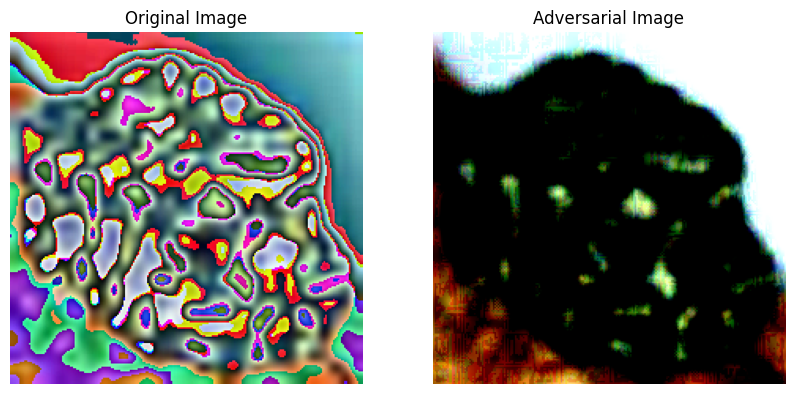


Top predictions for original image:

      chimpanzee: 34.03%
          beaver: 10.92%
     willow_tree: 9.68%
           camel: 6.16%
       porcupine: 5.23%

Top predictions for adversarial image:

           plain: 13.43%
      television: 9.49%
           plate: 3.72%
        dinosaur: 3.12%
        keyboard: 2.70%


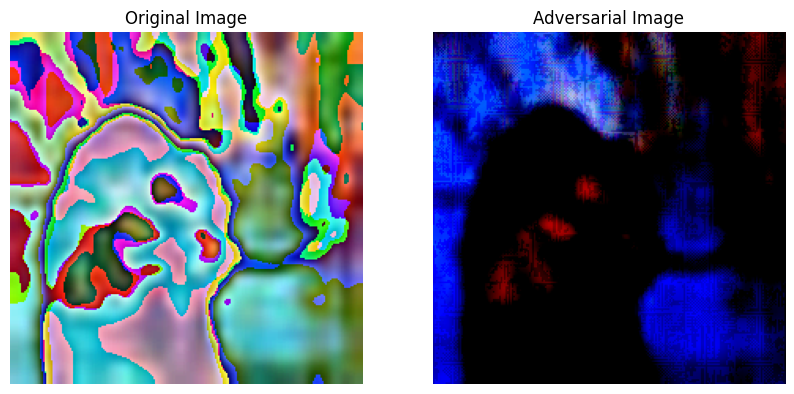


Top predictions for original image:

            crab: 21.82%
          spider: 19.83%
   aquarium_fish: 8.58%
       pine_tree: 5.31%
       palm_tree: 4.63%

Top predictions for adversarial image:

      television: 16.99%
       pine_tree: 8.56%
        dinosaur: 4.63%
          spider: 3.33%
        mushroom: 2.73%


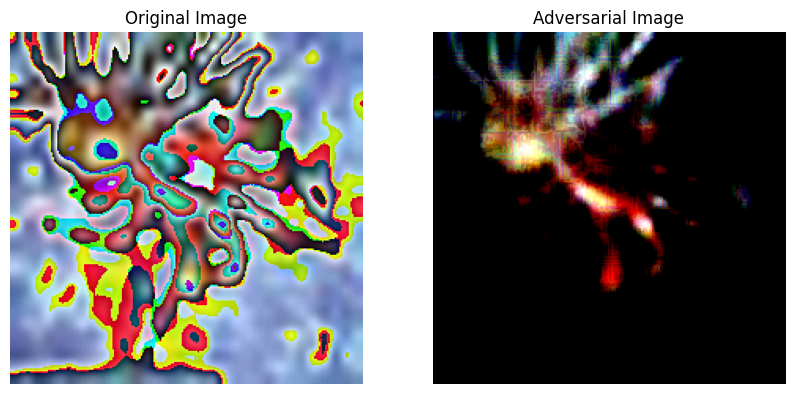


Top predictions for original image:

      lawn_mower: 72.22%
    pickup_truck: 13.13%
         tractor: 5.81%
          beetle: 5.23%
    sweet_pepper: 1.30%

Top predictions for adversarial image:

      lawn_mower: 89.54%
         tractor: 5.10%
    pickup_truck: 2.14%
        dinosaur: 0.37%
      motorcycle: 0.24%


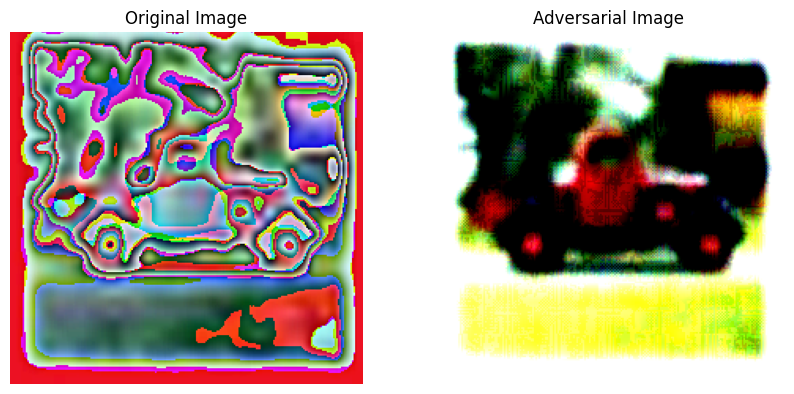


Top predictions for original image:

             bee: 86.66%
       sunflower: 5.09%
       butterfly: 1.02%
          beetle: 0.97%
     caterpillar: 0.90%

Top predictions for adversarial image:

           tiger: 15.87%
            lion: 10.50%
             fox: 7.56%
          possum: 6.64%
            wolf: 4.51%


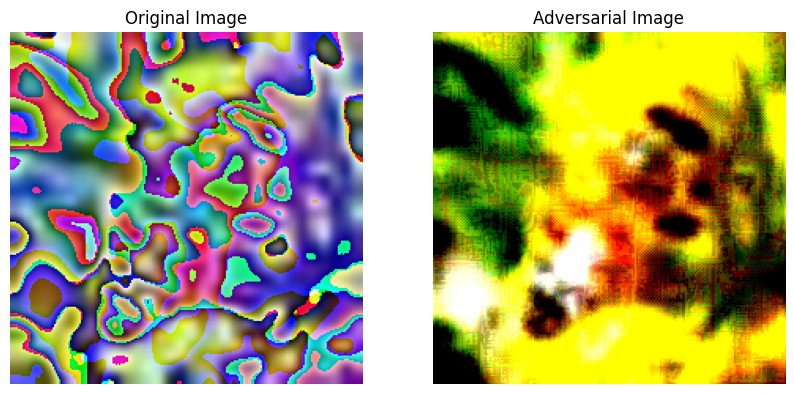

In [ ]:
# Process and evaluate 5 images
images_to_process = [3637, 50, 100, 150, 200]  # Replace with your desired indices

for idx in images_to_process:
    image, class_id = cifar100[idx]
    original, adversarial = process_and_evaluate(image, class_id, model, preprocess, text_inputs, device)

    # Function to convert tensor to image
    def tensor_to_image(tensor):
        unloader = transforms.ToPILImage()
        image = tensor.cpu().clone()
        image = image.squeeze(0)
        image = unloader(image)
        return image

    # Plot original and adversarial images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(tensor_to_image(original))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(tensor_to_image(adversarial))
    axes[1].set_title('Adversarial Image')
    axes[1].axis('off')

    plt.show()


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-5i2fvflc
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-5i2fvflc
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
Files already downloaded and verified

Top predictions for original image:

           snake: 65.31%
          turtle: 12.29%
    sweet_pepper: 3.83%
          lizard: 1.88%
       crocodile: 1.75%

Top predictions for adversarial image:

        dinosaur: 4.74%
            lion: 4.27%
           plain: 4.00%
            bear: 3.58%
          cattle: 3.46%


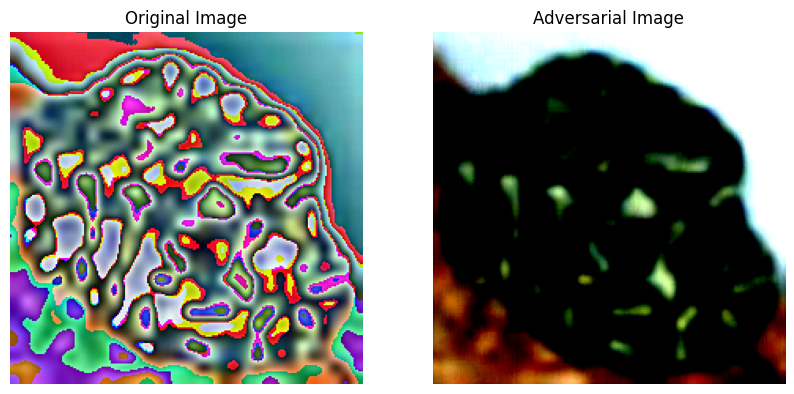


Top predictions for original image:

      chimpanzee: 34.03%
          beaver: 10.92%
     willow_tree: 9.68%
           camel: 6.16%
       porcupine: 5.23%

Top predictions for adversarial image:

           plain: 9.80%
             man: 3.71%
           plate: 3.32%
        dinosaur: 3.19%
             boy: 3.13%


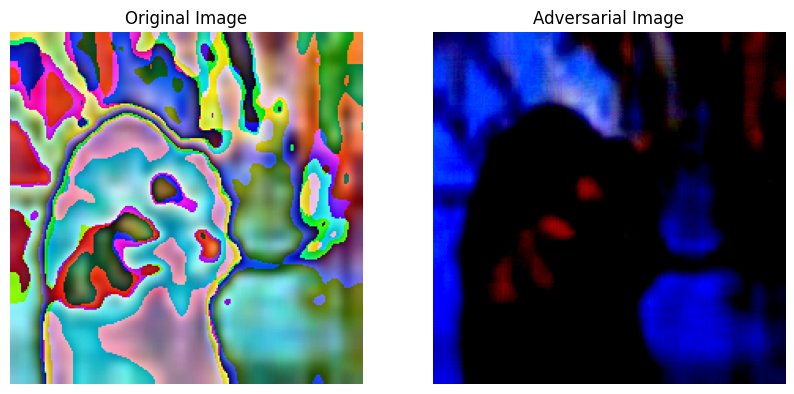


Top predictions for original image:

            crab: 21.82%
          spider: 19.83%
   aquarium_fish: 8.58%
       pine_tree: 5.31%
       palm_tree: 4.63%

Top predictions for adversarial image:

      television: 10.52%
            lamp: 8.54%
           plate: 4.19%
            crab: 3.68%
      maple_tree: 3.46%


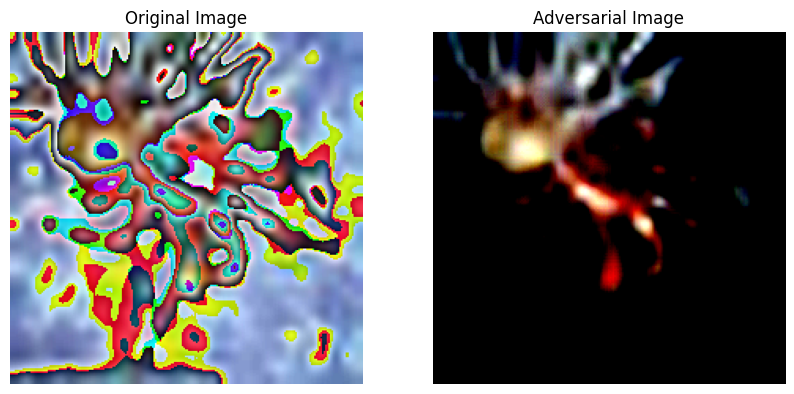


Top predictions for original image:

      lawn_mower: 72.22%
    pickup_truck: 13.13%
         tractor: 5.81%
          beetle: 5.23%
    sweet_pepper: 1.30%

Top predictions for adversarial image:

      lawn_mower: 88.33%
    pickup_truck: 4.90%
         tractor: 3.38%
      motorcycle: 0.83%
        dinosaur: 0.20%


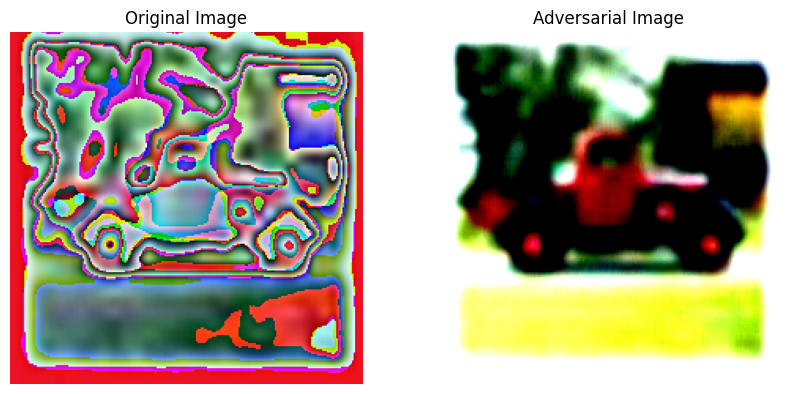


Top predictions for original image:

             bee: 86.66%
       sunflower: 5.09%
       butterfly: 1.02%
          beetle: 0.97%
     caterpillar: 0.90%

Top predictions for adversarial image:

       pine_tree: 6.05%
       sunflower: 5.97%
        dinosaur: 5.21%
      maple_tree: 4.04%
        oak_tree: 3.46%


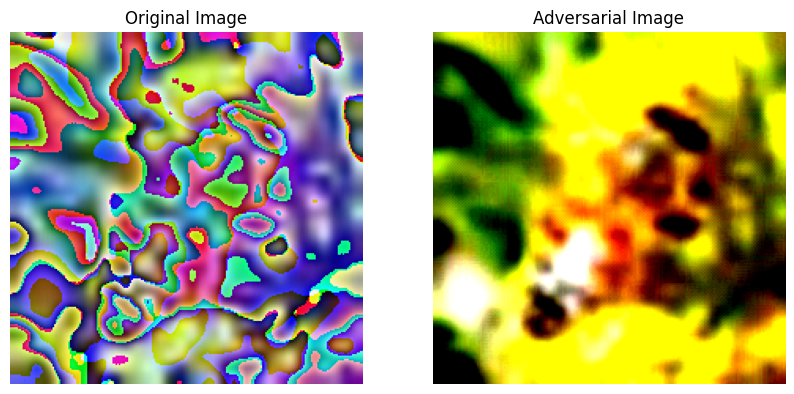

In [ ]:
!pip install git+https://github.com/openai/CLIP.git
import os
import clip
import torch
import numpy as np
from torchvision.datasets import CIFAR100
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torch.autograd import Variable

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Download the dataset
cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)

# Prepare the text inputs for CLIP model
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar100.classes]).to(device)

class FGSM:
    def __init__(self, model, epsilon, criterion):
        self.model = model
        self.epsilon = epsilon
        self.criterion = criterion

    def perturb(self, x, y, targeted=False):
        x_adv = Variable(x.data, requires_grad=True)
        h_adv = self.model.encode_image(x_adv)
        if targeted:
            cost = self.criterion(h_adv, y)
        else:
            cost = -self.criterion(h_adv, y)

        self.model.zero_grad()
        if x_adv.grad is not None:
            x_adv.grad.data.fill_(0)
        cost.backward()

        x_adv.grad.sign_()
        x_adv = x_adv - self.epsilon * x_adv.grad
        x_adv = torch.clamp(x_adv, 0, 1)  # Assuming the image pixels are in the [0, 1] range
        return x_adv
def process_and_evaluate(image, class_id, model, preprocess, text_inputs, device, epsilon=0.03):
    # Preprocess the image
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    criterion = torch.nn.CrossEntropyLoss()
    label_tensor = torch.tensor([class_id], device=device)
    fgsm = FGSM(model, epsilon, criterion)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Process and evaluate 5 images
images_to_process = [3637, 50, 100, 150, 200]  # Replace with your desired indices

for idx in images_to_process:
    image, class_id = cifar100[idx]
    original, adversarial = process_and_evaluate(image, class_id, model, preprocess, text_inputs, device)

    # Function to convert tensor to image
    def tensor_to_image(tensor):
        unloader = transforms.ToPILImage()
        image = tensor.cpu().clone()
        image = image.squeeze(0)
        image = unloader(image)
        return image

    # Plot original and adversarial images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(tensor_to_image(original))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(tensor_to_image(adversarial))
    axes[1].set_title('Adversarial Image')
    axes[1].axis('off')

    plt.show()


Top predictions for original image:

           snake: 65.31%
          turtle: 12.29%
    sweet_pepper: 3.83%
          lizard: 1.88%
       crocodile: 1.75%

Top predictions for adversarial image:

        dinosaur: 4.74%
            lion: 4.27%
           plain: 4.00%
            bear: 3.58%
          cattle: 3.46%


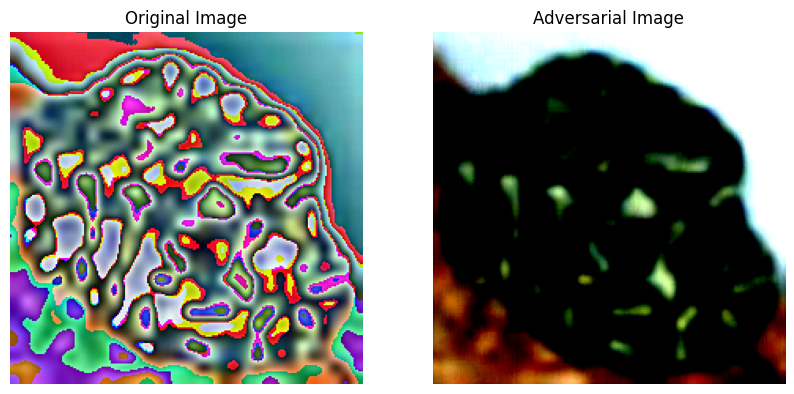


Top predictions for original image:

      chimpanzee: 34.03%
          beaver: 10.92%
     willow_tree: 9.68%
           camel: 6.16%
       porcupine: 5.23%

Top predictions for adversarial image:

           plain: 9.80%
             man: 3.71%
           plate: 3.32%
        dinosaur: 3.19%
             boy: 3.13%


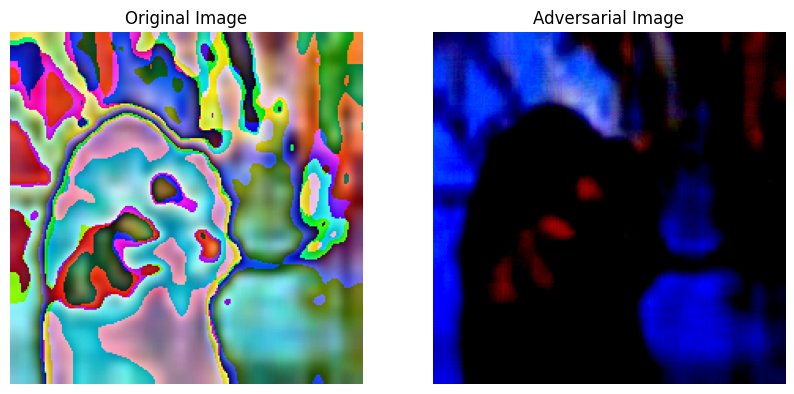


Top predictions for original image:

            crab: 21.82%
          spider: 19.83%
   aquarium_fish: 8.58%
       pine_tree: 5.31%
       palm_tree: 4.63%

Top predictions for adversarial image:

      television: 10.52%
            lamp: 8.54%
           plate: 4.19%
            crab: 3.68%
      maple_tree: 3.46%


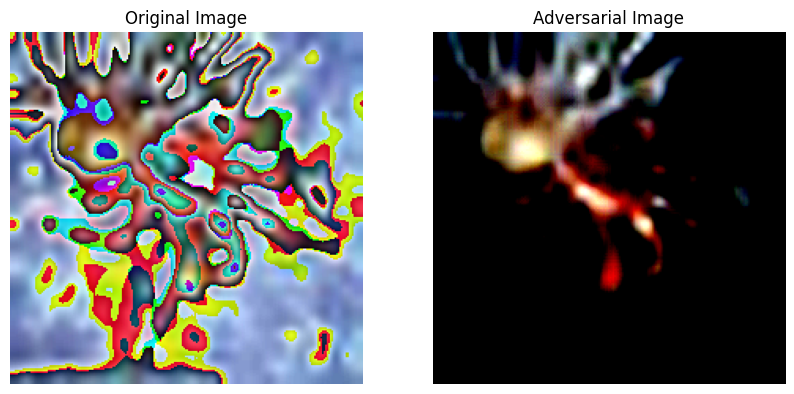


Top predictions for original image:

      lawn_mower: 72.22%
    pickup_truck: 13.13%
         tractor: 5.81%
          beetle: 5.23%
    sweet_pepper: 1.30%

Top predictions for adversarial image:

      lawn_mower: 88.33%
    pickup_truck: 4.90%
         tractor: 3.38%
      motorcycle: 0.83%
        dinosaur: 0.20%


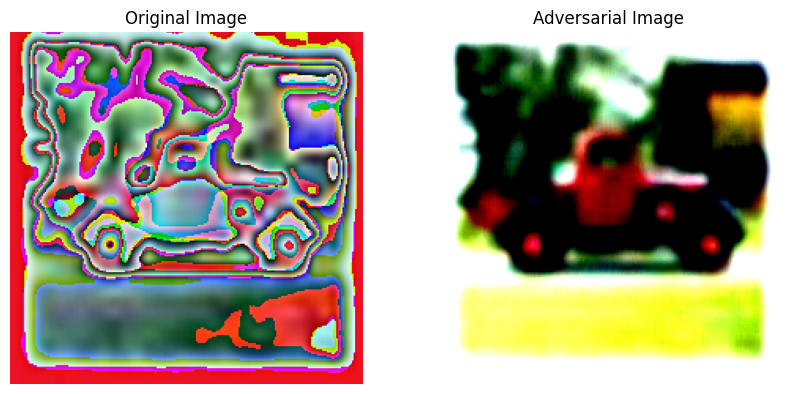

KeyboardInterrupt: 

In [ ]:
class FGSM:
    def __init__(self, model, epsilon, criterion):
        self.model = model
        self.epsilon = epsilon
        self.criterion = criterion

    def perturb(self, x, y, targeted=False):
        x_adv = Variable(x.data, requires_grad=True)
        h_adv = self.model.encode_image(x_adv)
        if targeted:
            cost = self.criterion(h_adv, y)
        else:
            cost = -self.criterion(h_adv, y)

        self.model.zero_grad()
        if x_adv.grad is not None:
            x_adv.grad.data.fill_(0)
        cost.backward()

        x_adv.grad.sign_()
        x_adv = x_adv - self.epsilon * x_adv.grad
        x_adv = torch.clamp(x_adv, 0, 1)  # Assuming the image pixels are in the [0, 1] range
        return x_adv
def process_and_evaluate(image, class_id, model, preprocess, text_inputs, device, epsilon=0.03):
    # Preprocess the image
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    criterion = torch.nn.CrossEntropyLoss()
    label_tensor = torch.tensor([class_id], device=device)
    fgsm = FGSM(model, epsilon, criterion)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar100.classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Process and evaluate 5 images
images_to_process = [3637, 50, 100, 150, 200]  # Replace with your desired indices

for idx in images_to_process:
    image, class_id = cifar100[idx]
    original, adversarial = process_and_evaluate(image, class_id, model, preprocess, text_inputs, device)

    # Function to convert tensor to image
    def tensor_to_image(tensor):
        unloader = transforms.ToPILImage()
        image = tensor.cpu().clone()
        image = image.squeeze(0)
        image = unloader(image)
        return image

    # Plot original and adversarial images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(tensor_to_image(original))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(tensor_to_image(adversarial))
    axes[1].set_title('Adversarial Image')
    axes[1].axis('off')

    plt.show()



Top predictions for original image:

         class 7: 16.54%
         class 3: 4.86%
         class 0: 4.83%
         class 1: 4.47%
        class 77: 4.05%

Top predictions for adversarial image:

         class 7: 15.34%
        class 77: 6.81%
         class 0: 5.74%
         class 2: 4.25%
         class 3: 4.03%


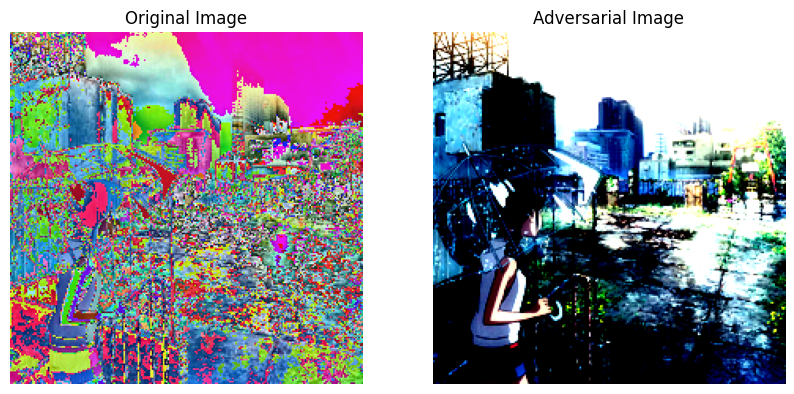

In [ ]:
import os
import clip
import torch
import numpy as np
from PIL import Image  # Make sure to import Image from PIL
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Prepare the text inputs for the CLIP model
cifar_classes = [f"class {i}" for i in range(100)]  # Placeholder for CIFAR classes
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar_classes]).to(device)

class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image

def process_and_evaluate(image_path, model, preprocess, text_inputs, device, epsilon=0.001):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input

# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/tq.png'
original, adversarial = process_and_evaluate(image_path, model, preprocess, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()



Top predictions for original image:

         class 7: 16.54%
         class 3: 4.86%
         class 0: 4.83%
         class 1: 4.47%
        class 77: 4.05%

Top predictions for adversarial image:

         class 7: 13.84%
        class 77: 6.29%
         class 0: 5.42%
         class 2: 4.23%
         class 3: 3.96%


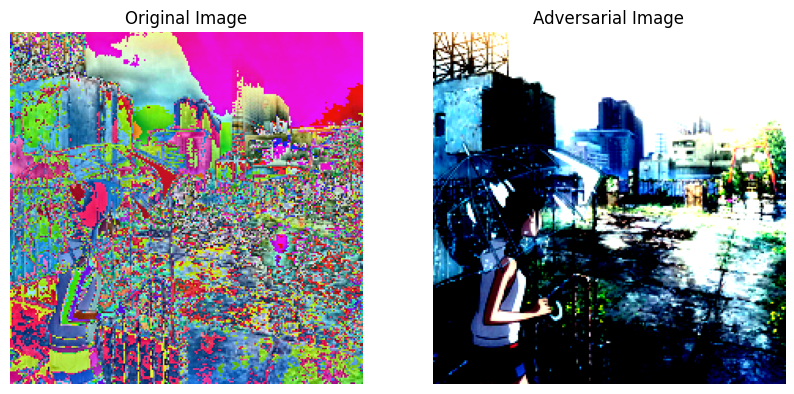

In [ ]:
import os
import clip
import torch
import numpy as np
from PIL import Image  # Make sure to import Image from PIL
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Prepare the text inputs for the CLIP model
cifar_classes = [f"class {i}" for i in range(100)]  # Placeholder for CIFAR classes
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar_classes]).to(device)

class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image
def process_and_evaluate(image_path, model, preprocess, text_inputs, device, epsilon=0.01):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/tq.png'  # Example path
original, adversarial = process_and_evaluate(image_path, model, preprocess, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()


In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image


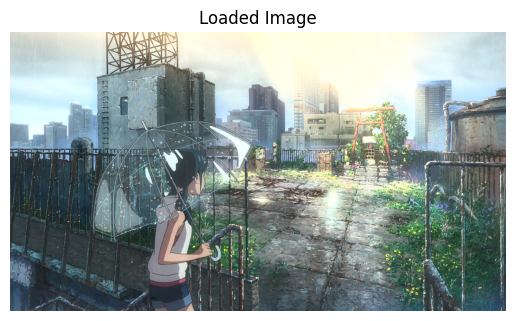

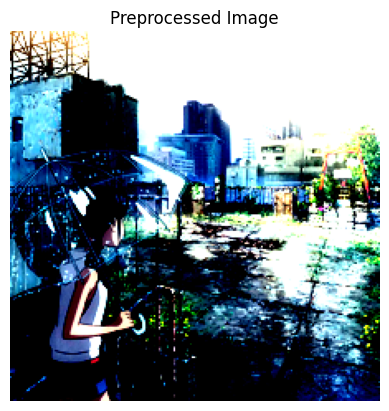


Top predictions for original image:

         class 7: 16.54%
         class 3: 4.86%
         class 0: 4.83%
         class 1: 4.47%
        class 77: 4.05%

Top predictions for adversarial image:

         class 7: 13.84%
        class 77: 6.29%
         class 0: 5.42%
         class 2: 4.23%
         class 3: 3.96%


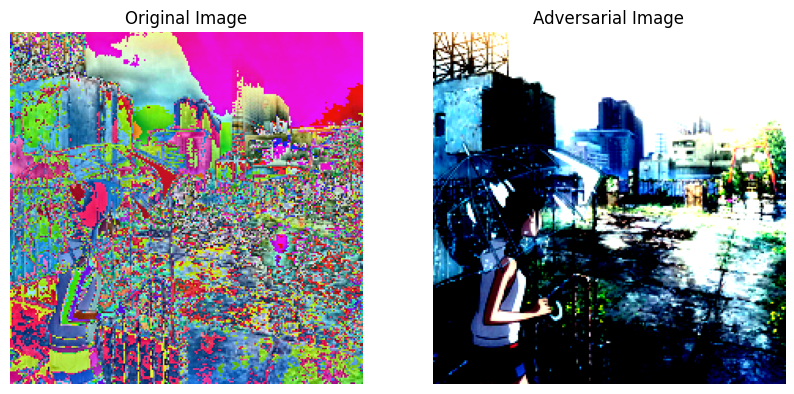

In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image
def process_and_evaluate(image_path, model, preprocess, text_inputs, device, epsilon=0.01):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')

    # Visualize the loaded image to ensure it is correct
    plt.imshow(image)
    plt.title('Loaded Image')
    plt.axis('off')
    plt.show()

    # Apply preprocessing
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the preprocessed image to ensure it is correct
    preprocessed_image = image_input.cpu().squeeze(0).detach().permute(1, 2, 0).numpy()
    plt.imshow(preprocessed_image)
    plt.title('Preprocessed Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/tq.png'  # Example path
original, adversarial = process_and_evaluate(image_path, model, preprocess, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()


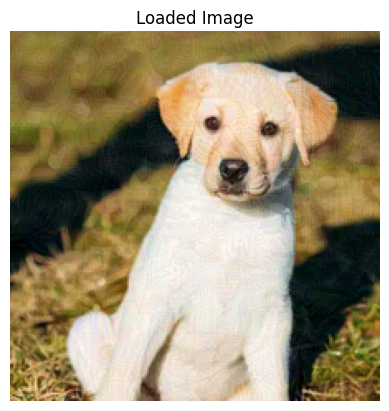

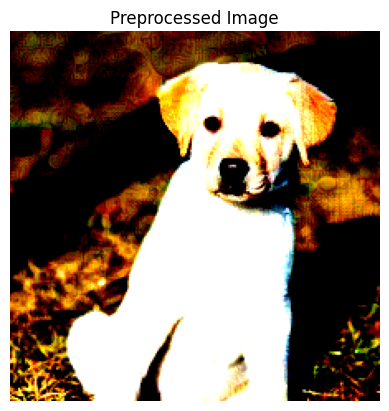


Top predictions for original image:

         class 7: 11.60%
         class 1: 8.21%
         class 9: 5.27%
         class 3: 4.22%
         class 0: 3.93%

Top predictions for adversarial image:

         class 7: 9.82%
         class 1: 8.26%
         class 9: 5.38%
         class 3: 5.07%
         class 6: 4.67%


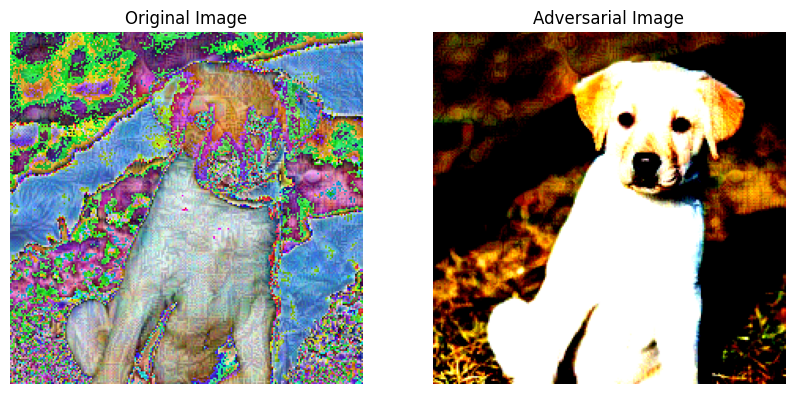

In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image
def process_and_evaluate(image_path, model, preprocess, text_inputs, device, epsilon=0.01):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')

    # Visualize the loaded image to ensure it is correct
    plt.imshow(image)
    plt.title('Loaded Image')
    plt.axis('off')
    plt.show()

    # Apply preprocessing
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the preprocessed image to ensure it is correct
    preprocessed_image = image_input.cpu().squeeze(0).detach().permute(1, 2, 0).numpy()
    plt.imshow(preprocessed_image)
    plt.title('Preprocessed Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/dog.png'  # Example path
original, adversarial = process_and_evaluate(image_path, model, preprocess, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()


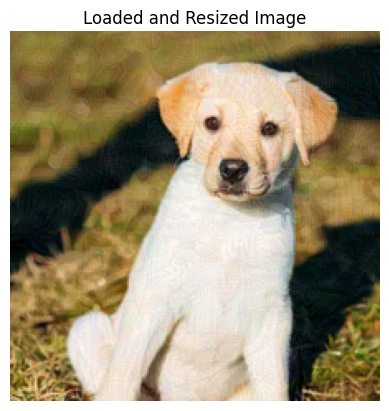


Top predictions for original image:

         class 7: 9.57%
         class 1: 7.52%
         class 9: 5.19%
         class 3: 4.77%
         class 0: 4.55%

Top predictions for adversarial image:

         class 1: 2.83%
        class 38: 2.79%
         class 6: 2.63%
         class 9: 2.20%
        class 36: 2.04%


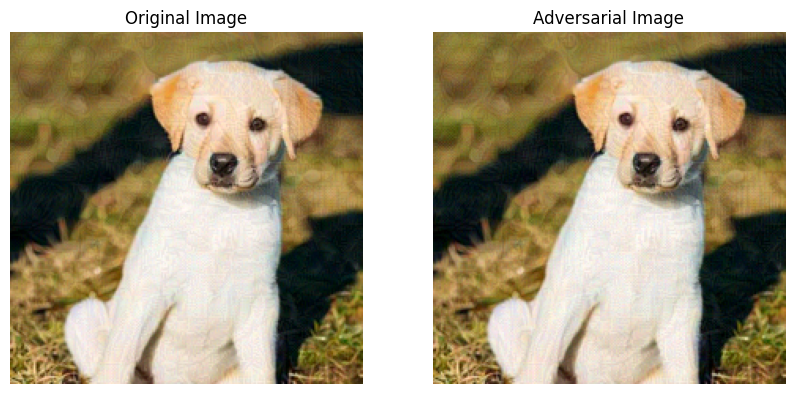

In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image
def process_and_evaluate(image_path, model, text_inputs, device, epsilon=0.01):
    # Load and resize the image
    image = Image.open(image_path).convert('RGB')
    image = image.resize((224, 224))  # Resize to 224x224 pixels
    image_input = transforms.ToTensor()(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the loaded and resized image
    plt.imshow(image)
    plt.title('Loaded and Resized Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input

# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/dog.png'  # Example path
original, adversarial = process_and_evaluate(image_path, model, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()


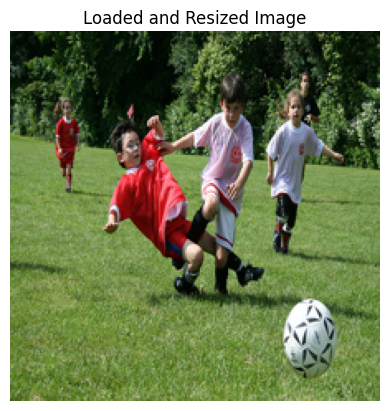


Top predictions for original image:

           plain: 24.29%
             boy: 20.42%
            girl: 9.51%
      lawn_mower: 5.71%
          rocket: 5.47%

Top predictions for adversarial image:

            girl: 26.50%
             boy: 10.00%
      lawn_mower: 8.51%
      television: 8.30%
       butterfly: 5.09%


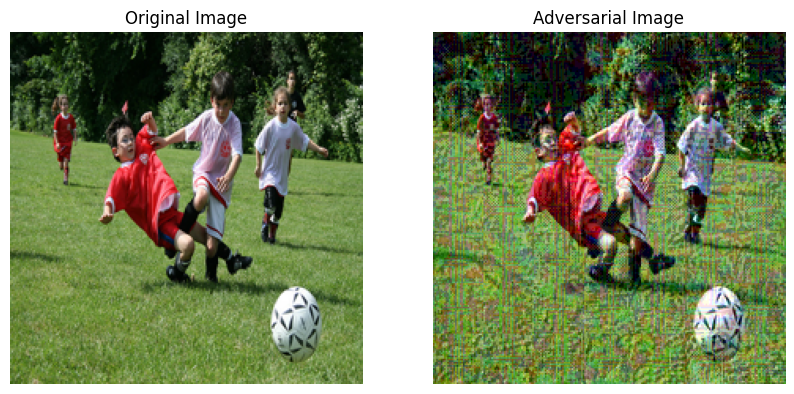

In [ ]:
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect
        sign_data_grad = images.grad.data.sign()
        perturbed_image = images + self.epsilon * sign_data_grad
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image
def process_and_evaluate(image_path, model, text_inputs, device, epsilon=0.1):
    # Load and resize the image
    image = Image.open(image_path).convert('RGB')
    image = image.resize((224, 224))  # Resize to 224x224 pixels
    image_input = transforms.ToTensor()(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the loaded and resized image
    plt.imshow(image)
    plt.title('Loaded and Resized Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input

# Replace 'path/to/your/image.jpg' with the actual path of the uploaded image
image_path = '/content/play.jpeg'  # Example path
original, adversarial = process_and_evaluate(image_path, model, text_inputs, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()

In [ ]:
!pip install git+https://github.com/openai/CLIP.git
!pip install torchvision
!pip install pillow


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-h9ocv6rm
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-h9ocv6rm
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


Files already downloaded and verified
Files already downloaded and verified


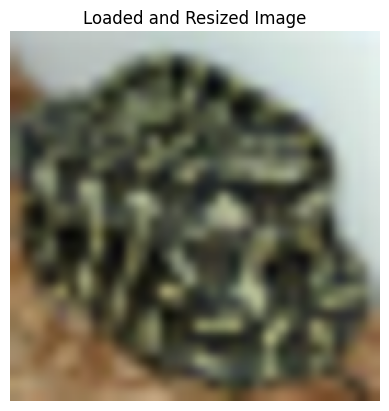


Top predictions for original image:

           snake: 65.31%
          turtle: 12.29%
    sweet_pepper: 3.83%
          lizard: 1.88%
       crocodile: 1.75%

Top predictions for adversarial image:

            bear: 6.98%
        dinosaur: 4.73%
            wolf: 3.68%
            lion: 3.36%
          cattle: 3.34%


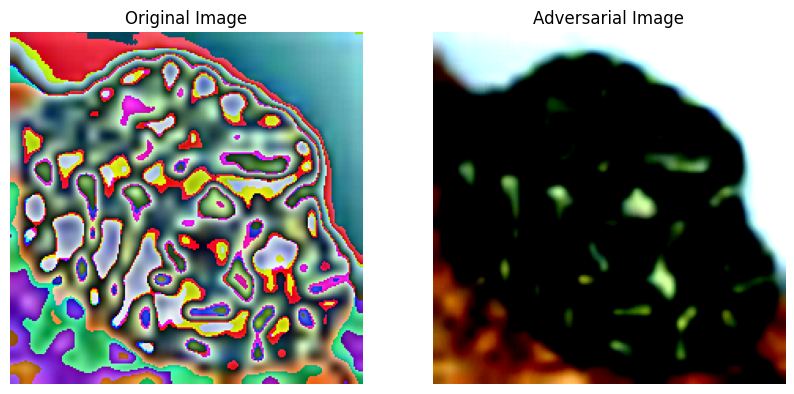

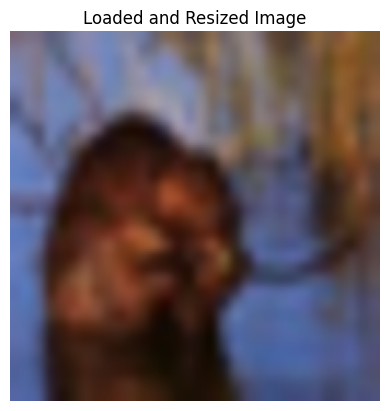


Top predictions for original image:

      chimpanzee: 34.03%
          beaver: 10.92%
     willow_tree: 9.68%
           camel: 6.16%
       porcupine: 5.23%

Top predictions for adversarial image:

           plain: 7.74%
           plate: 4.55%
             man: 3.36%
        dinosaur: 3.36%
             boy: 2.85%


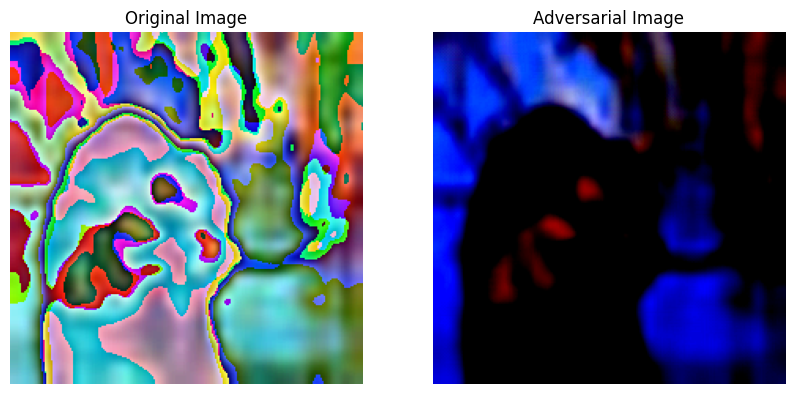

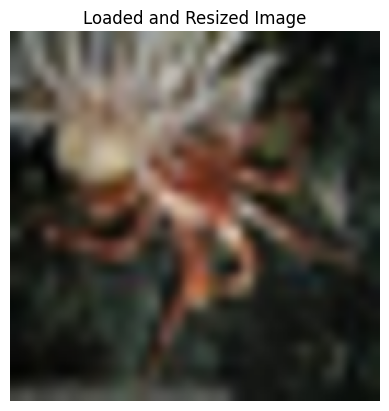


Top predictions for original image:

            crab: 21.82%
          spider: 19.83%
   aquarium_fish: 8.58%
       pine_tree: 5.31%
       palm_tree: 4.63%


KeyboardInterrupt: 

In [ ]:
import os
import clip
import torch
import numpy as np
from PIL import Image
from torchvision.datasets import CIFAR100
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Load CIFAR-100 dataset to access class labels
cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)
cifar_classes = cifar100.classes

# Prepare the text inputs for the CLIP model
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar_classes]).to(device)

class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, label_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, label_index)

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image

def process_and_evaluate(image, class_id, model, preprocess, text_inputs, device, epsilon=0.01):
    # Preprocess the image (resize to 224x224 pixels)
    image = image.resize((224, 224))
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the loaded and resized image
    plt.imshow(image)
    plt.title('Loaded and Resized Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop predictions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    label_tensor = torch.tensor([indices[0].item()], device=device)  # Use the top prediction as the label
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, label_tensor)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop predictions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{cifar_classes[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input
# Load the CIFAR-100 dataset
cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)

# Select a few images to process
images_to_process = [3637, 50, 100, 150, 200]  # Replace with your desired indices

for idx in images_to_process:
    image, class_id = cifar100[idx]
    original, adversarial = process_and_evaluate(image, class_id, model, preprocess, text_inputs, device)

    # Function to convert tensor to image
    def tensor_to_image(tensor):
        unloader = transforms.ToPILImage()
        image = tensor.cpu().clone()
        image = image.squeeze(0)
        image = unloader(image)
        return image

    # Plot original and adversarial images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(tensor_to_image(original))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(tensor_to_image(adversarial))
    axes[1].set_title('Adversarial Image')
    axes[1].axis('off')

    plt.show()


In [ ]:
# Step 1: Install Required Libraries
!pip install git+https://github.com/openai/CLIP.git
!pip install torchvision
!pip install pillow

# Step 2: Import Libraries and Load the Model
import os
import clip
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F



  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-1s2kggt5
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-1s2kggt5
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using c

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 184MiB/s]


FileNotFoundError: [Errno 2] No such file or directory: '/path/to/your/image.jpg'

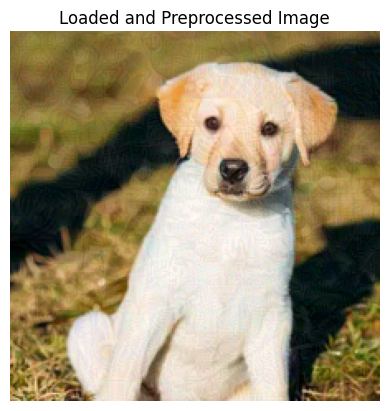


Top descriptions for original image:

a photo of a dog: 98.98%
a photo of a cat: 0.51%
a photo of a person: 0.49%
a photo of a car: 0.02%
a photo of a tree: 0.00%

Top descriptions for adversarial image:

a photo of a dog: 97.49%
a photo of a cat: 1.58%
a photo of a person: 0.91%
a photo of a car: 0.01%
a photo of a tree: 0.00%


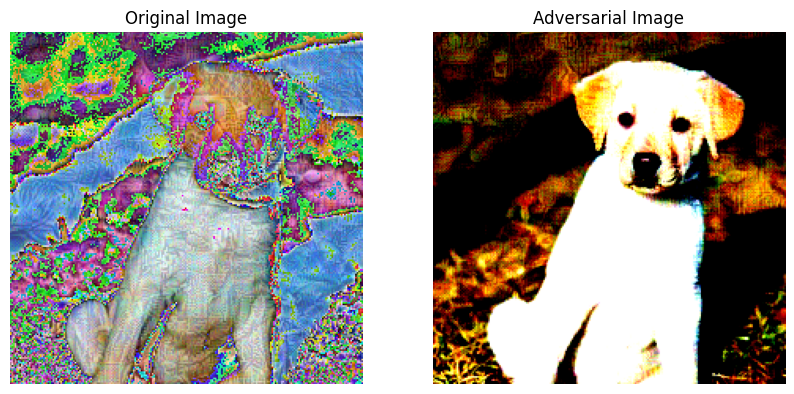

In [ ]:
# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Prepare a set of textual descriptions
descriptions = [
    "a photo of a dog",
    "a photo of a cat",
    "a photo of a car",
    "a photo of a tree",
    "a photo of a person"
]

# Tokenize descriptions
text_inputs = torch.cat([clip.tokenize(desc) for desc in descriptions]).to(device)

# Step 3: Implement FGSM Attack
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, target_desc_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, torch.tensor([target_desc_index], device=device))

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image

# Step 4: Function to Process and Evaluate Images
def process_and_evaluate(image, model, preprocess, text_inputs, descriptions, device, epsilon=0.1):
    # Preprocess the image using CLIP's preprocess function
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the loaded and resized image
    plt.imshow(image)
    plt.title('Loaded and Preprocessed Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop descriptions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{descriptions[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    target_desc_index = indices[0].item()  # Use the top prediction as the target
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, target_desc_index)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop descriptions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{descriptions[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input

# Step 5: Process a Sample Image
# Load a sample image
image_path = '/content/drive/MyDrive/Colab Notebooks/dog.png'  # Provide the actual path to the image
image = Image.open(image_path).convert('RGB')

# Process and evaluate the image
original, adversarial = process_and_evaluate(image, model, preprocess, text_inputs, descriptions, device)

# Function to convert tensor to image
def tensor_to_image(tensor):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

# Plot original and adversarial images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(tensor_to_image(original))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(tensor_to_image(adversarial))
axes[1].set_title('Adversarial Image')
axes[1].axis('off')

plt.show()

100%|██████████| 169001437/169001437 [00:03<00:00, 49040374.56it/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache


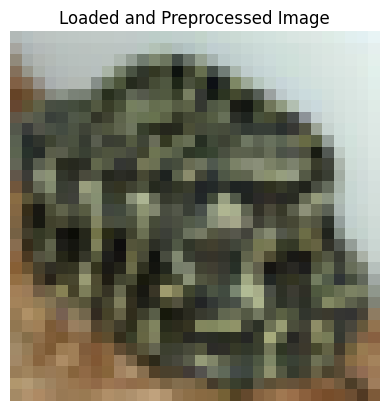


Top descriptions for original image:

a photo of a snake: 65.31%
a photo of a turtle: 12.29%
a photo of a sweet_pepper: 3.83%
a photo of a lizard: 1.88%
a photo of a crocodile: 1.75%

Top descriptions for adversarial image:

a photo of a lion: 7.61%
a photo of a wolf: 6.01%
a photo of a bear: 5.56%
a photo of a cattle: 5.50%
a photo of a girl: 5.25%


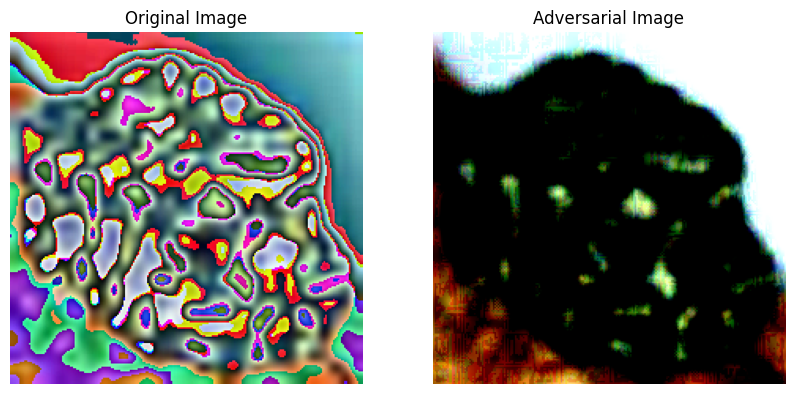

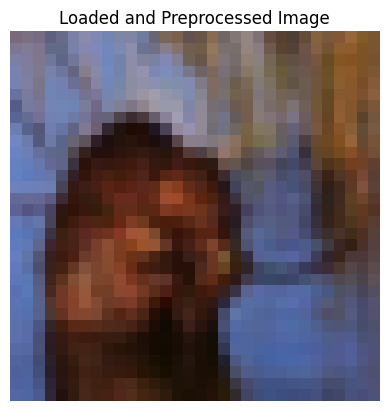


Top descriptions for original image:

a photo of a chimpanzee: 34.03%
a photo of a beaver: 10.92%
a photo of a willow_tree: 9.68%
a photo of a camel: 6.16%
a photo of a porcupine: 5.23%

Top descriptions for adversarial image:

a photo of a plain: 18.68%
a photo of a television: 6.90%
a photo of a plate: 3.95%
a photo of a pine_tree: 3.92%
a photo of a dinosaur: 3.09%


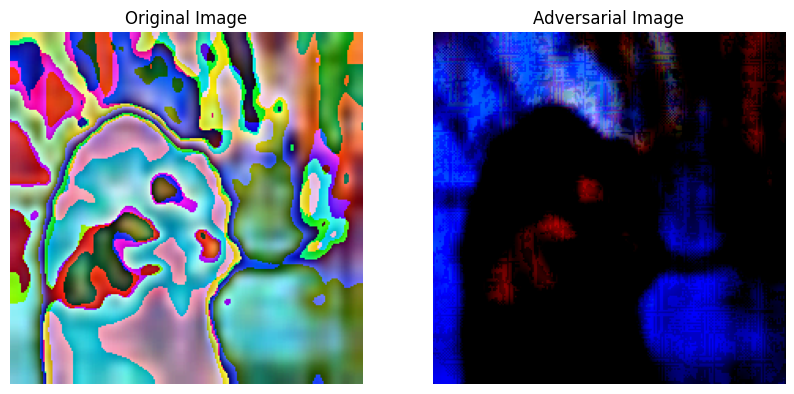

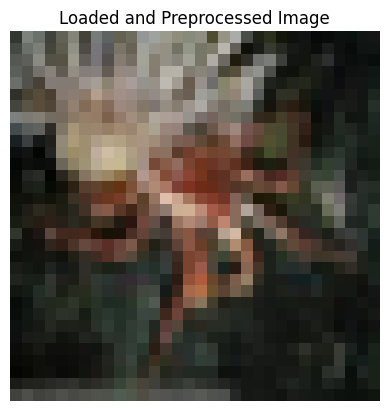


Top descriptions for original image:

a photo of a crab: 21.82%
a photo of a spider: 19.83%
a photo of a aquarium_fish: 8.58%
a photo of a pine_tree: 5.31%
a photo of a palm_tree: 4.63%

Top descriptions for adversarial image:

a photo of a television: 16.99%
a photo of a pine_tree: 8.56%
a photo of a dinosaur: 4.63%
a photo of a spider: 3.33%
a photo of a mushroom: 2.73%


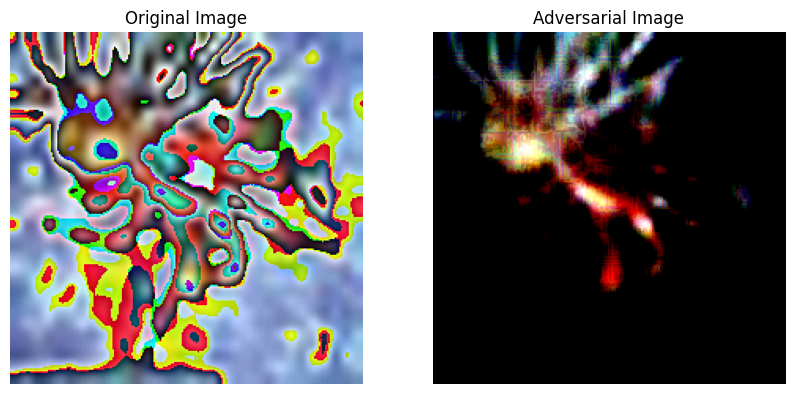

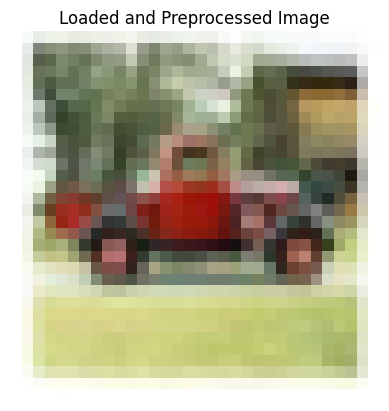


Top descriptions for original image:

a photo of a lawn_mower: 72.22%
a photo of a pickup_truck: 13.13%
a photo of a tractor: 5.81%
a photo of a beetle: 5.23%
a photo of a sweet_pepper: 1.30%

Top descriptions for adversarial image:

a photo of a lawn_mower: 48.42%
a photo of a pickup_truck: 36.55%
a photo of a tractor: 7.81%
a photo of a dinosaur: 1.00%
a photo of a beetle: 0.48%


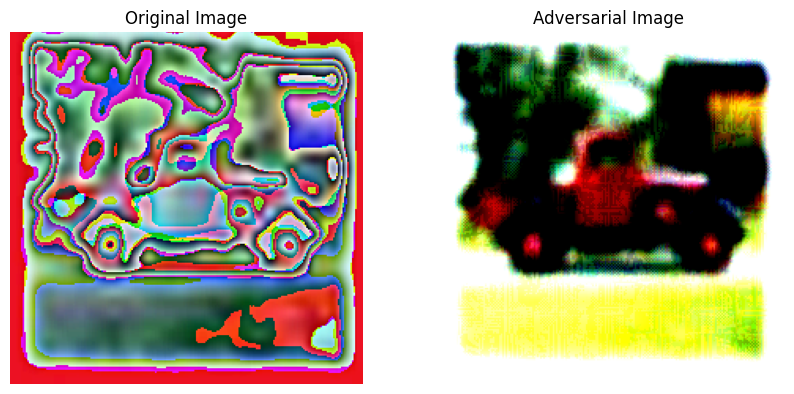

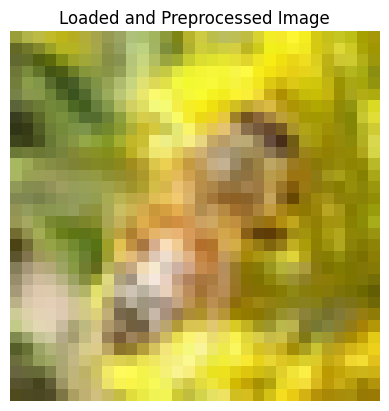


Top descriptions for original image:

a photo of a bee: 86.66%
a photo of a sunflower: 5.09%
a photo of a butterfly: 1.02%
a photo of a beetle: 0.97%
a photo of a caterpillar: 0.90%

Top descriptions for adversarial image:

a photo of a tiger: 15.87%
a photo of a lion: 10.50%
a photo of a fox: 7.56%
a photo of a possum: 6.64%
a photo of a wolf: 4.51%


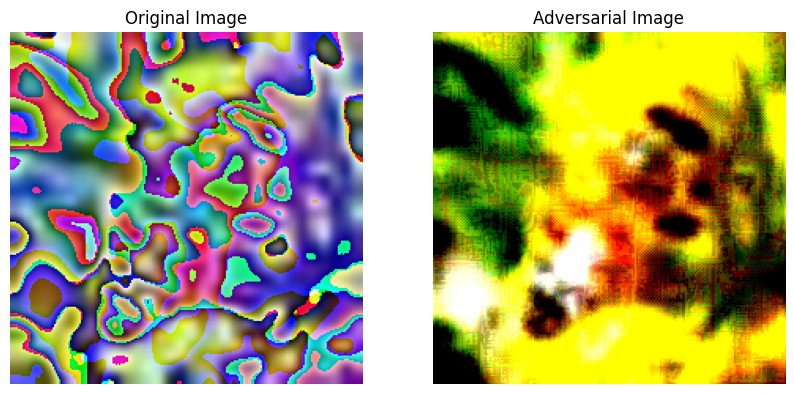

In [ ]:
from torchvision.datasets import CIFAR100

# Load the model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)

# Load CIFAR-100 dataset to access class labels and images
cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)
cifar_classes = cifar100.classes

# Step 3: Implement FGSM Attack
class FGSM:
    def __init__(self, model, epsilon):
        self.model = model
        self.epsilon = epsilon

    def perturb(self, images, target_desc_index):
        images = images.clone().detach().to(device)
        images.requires_grad = True

        # Forward pass
        outputs = self.model.encode_image(images)
        outputs = outputs / outputs.norm(dim=-1, keepdim=True)

        # Calculate similarity to all text inputs
        text_features = self.model.encode_text(text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * outputs @ text_features.T).softmax(dim=-1)

        # Define the loss
        loss = F.cross_entropy(similarity, torch.tensor([target_desc_index], device=device))

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Collect the element-wise sign of the data gradient
        sign_data_grad = images.grad.data.sign()

        # Create the perturbed image by adjusting each pixel of the input image
        perturbed_image = images + self.epsilon * sign_data_grad

        # Adding clipping to maintain the [0,1] range
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        return perturbed_image

# Step 4: Function to Process and Evaluate Images
def process_and_evaluate(image, model, preprocess, text_inputs, descriptions, device, epsilon=0.1):  # Increased epsilon value
    # Preprocess the image using CLIP's preprocess function
    image_input = preprocess(image).unsqueeze(0).to(device)
    image_input.requires_grad = True

    # Visualize the loaded and resized image
    plt.imshow(image)
    plt.title('Loaded and Preprocessed Image')
    plt.axis('off')
    plt.show()

    # Calculate features
    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    # Normalize features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate similarity
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)

    print("\nTop descriptions for original image:\n")
    for value, index in zip(values, indices):
        print(f"{descriptions[index]:>16s}: {100 * value.item():.2f}%")

    # Generate adversarial example using FGSM
    target_desc_index = indices[0].item()  # Use the top prediction as the target
    fgsm = FGSM(model, epsilon)
    adv_image_input = fgsm.perturb(image_input, target_desc_index)

    # Calculate features for the adversarial image
    with torch.no_grad():
        adv_image_features = model.encode_image(adv_image_input)
        adv_image_features /= adv_image_features.norm(dim=-1, keepdim=True)
        adv_similarity = (100.0 * adv_image_features @ text_features.T).softmax(dim=-1)
        adv_values, adv_indices = adv_similarity[0].topk(5)

    print("\nTop descriptions for adversarial image:\n")
    for value, index in zip(adv_values, adv_indices):
        print(f"{descriptions[index]:>16s}: {100 * value.item():.2f}%")

    return image_input, adv_image_input

# Step 5: Process CIFAR-100 Images
# Select a few images to process
images_to_process = [3637, 50, 100, 150, 200]  # Replace with your desired indices

# Prepare a set of textual descriptions for CIFAR-100 classes
descriptions = [f"a photo of a {c}" for c in cifar_classes]
text_inputs = torch.cat([clip.tokenize(desc) for desc in descriptions]).to(device)

for idx in images_to_process:
    image, class_id = cifar100[idx]
    original, adversarial = process_and_evaluate(image, model, preprocess, text_inputs, descriptions, device)

    # Function to convert tensor to image
    def tensor_to_image(tensor):
        unloader = transforms.ToPILImage()
        image = tensor.cpu().clone()
        image = image.squeeze(0)
        image = unloader(image)
        return image

    # Plot original and adversarial images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(tensor_to_image(original))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(tensor_to_image(adversarial))
    axes[1].set_title('Adversarial Image')
    axes[1].axis('off')

    plt.show()